Installing pycocotools...
--- Setup Complete. Starting Python Script ---
Loading annotations from: /kaggle/input/coco-2017-dataset/coco2017/annotations/instances_train2017.json...
loading annotations into memory...
Done (t=23.55s)
creating index...
index created!
Annotations loaded successfully.
Processing and displaying 20 images...


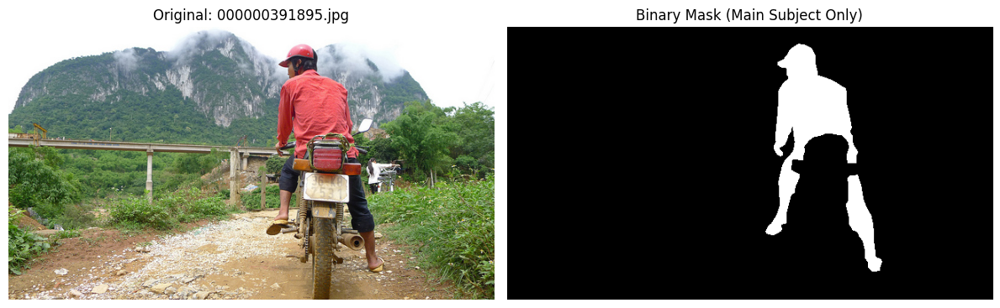

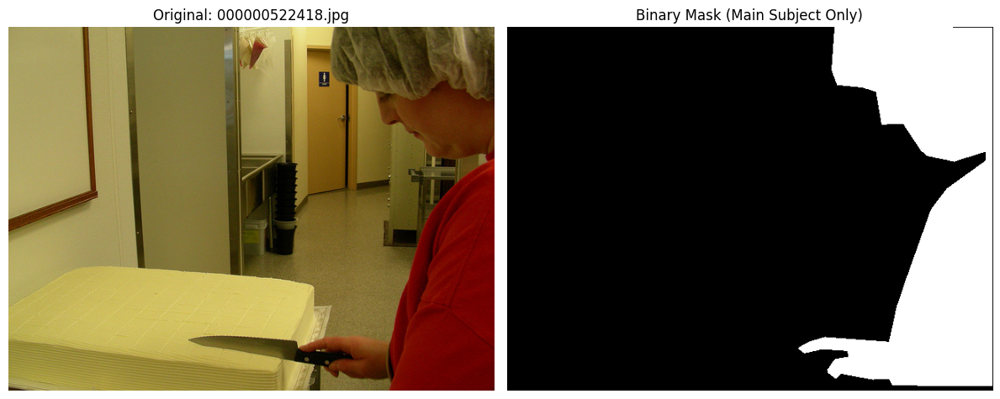

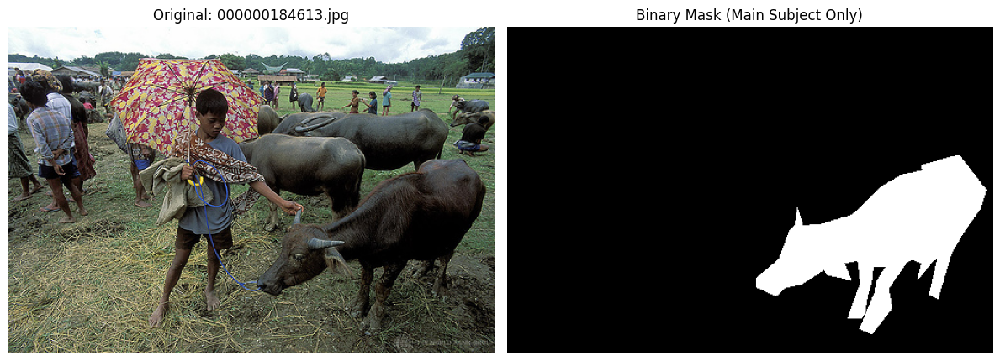

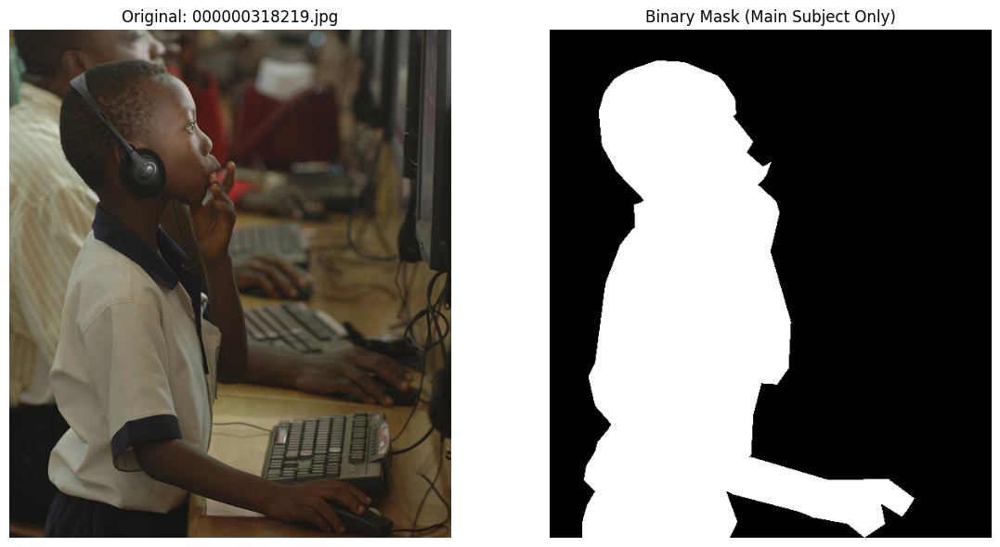

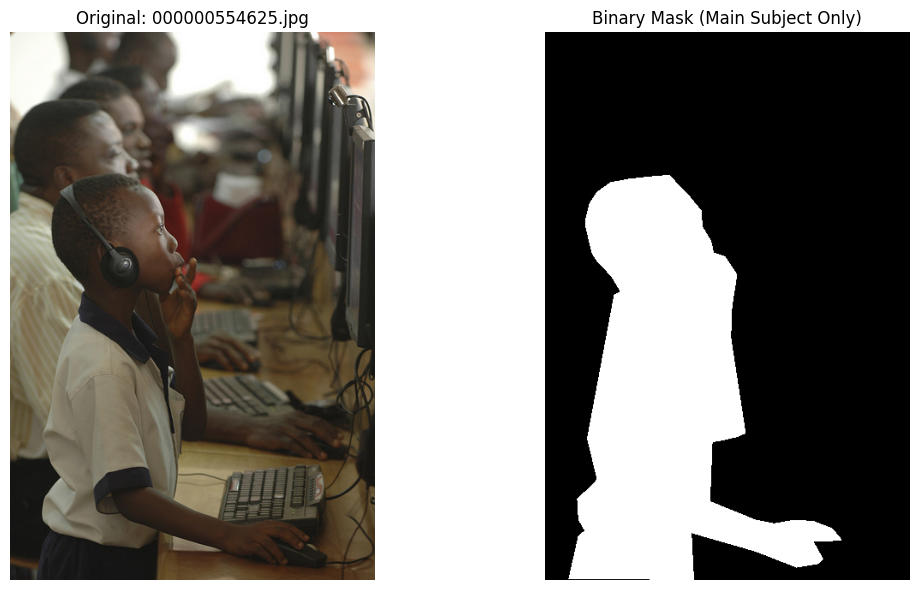

...

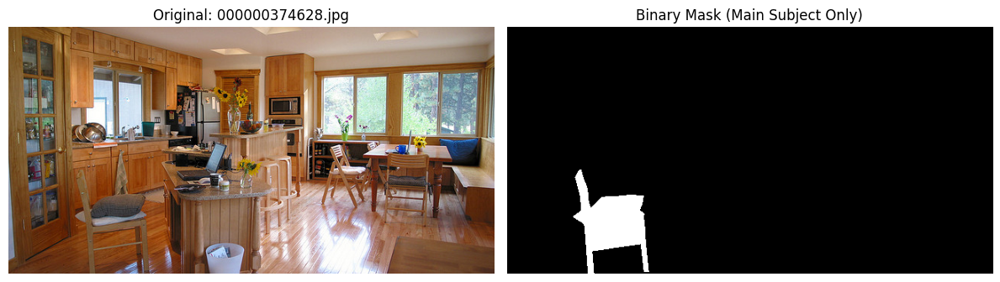

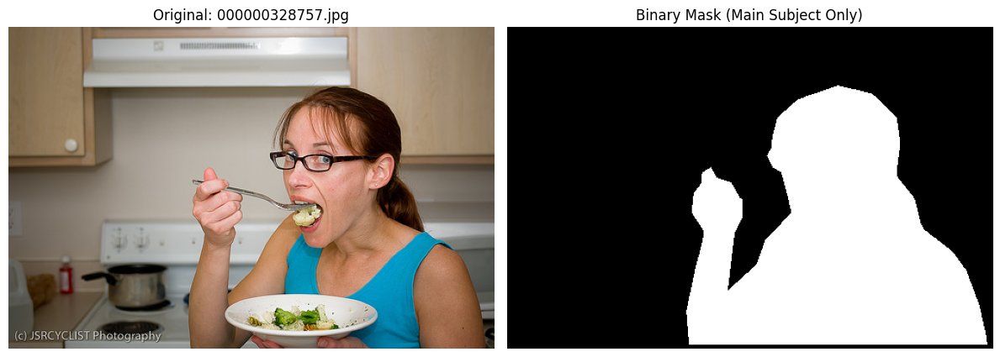

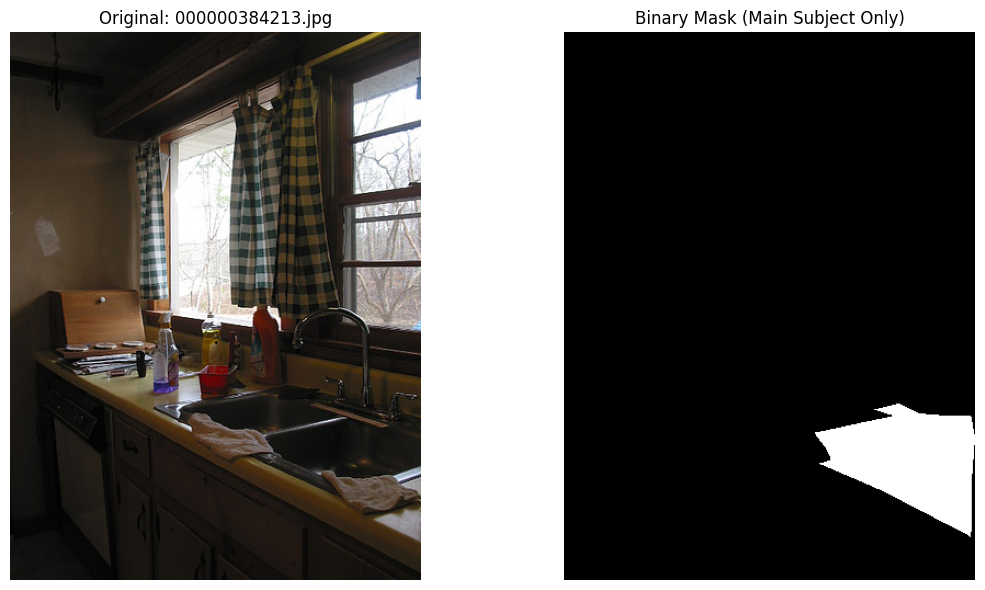

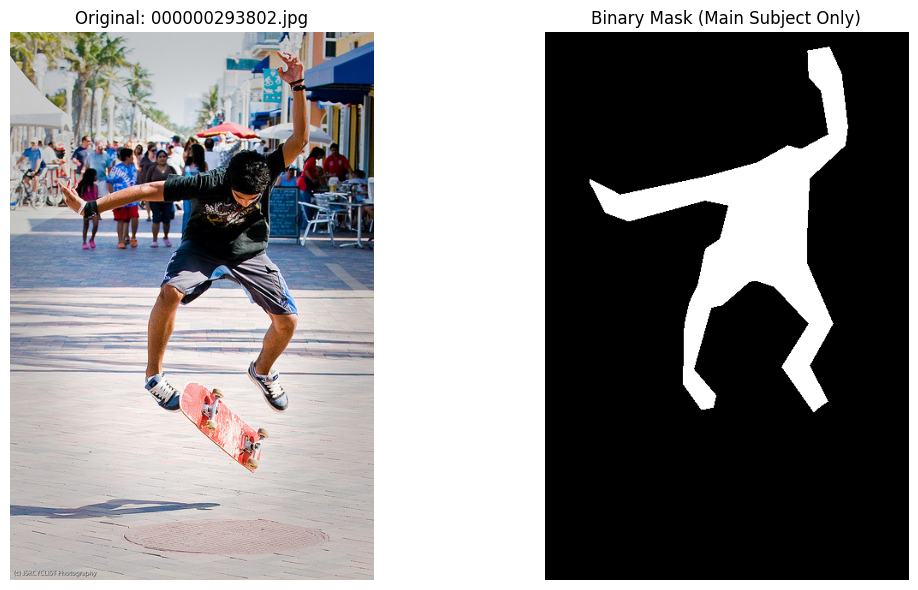

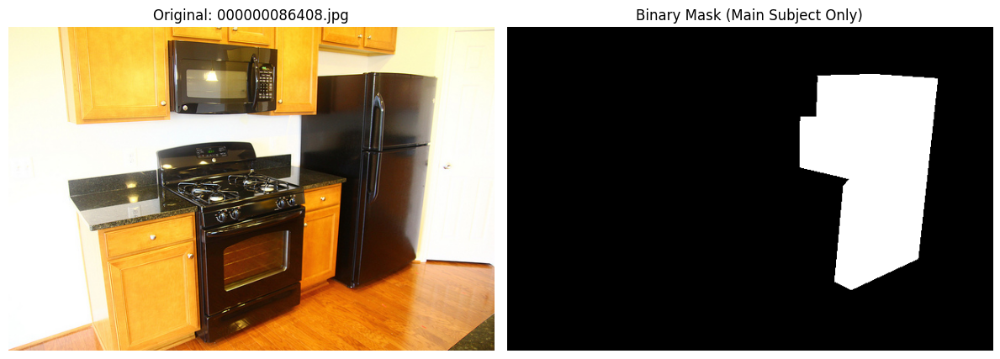

Successfully displayed 20 images with their main subject mask.


In [1]:
# --- Part 1: Install Tools ---
print("Installing pycocotools...")
# -q makes the install log "quiet" and clean
!pip install -q pycocotools

print("--- Setup Complete. Starting Python Script ---")

# --- Part 2: Python Visualization Script ---
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
from pycocotools.coco import COCO

# --- 1. Set up paths ---
# 
#  These are the CORRECT paths based on our previous work.
# 
IMAGE_DIR = '/kaggle/input/coco-2017-dataset/coco2017/train2017'
ANNOTATION_FILE = '/kaggle/input/coco-2017-dataset/coco2017/annotations/instances_train2017.json'


try:
    print(f"Loading annotations from: {ANNOTATION_FILE}...")
    # This loads the 2.5GB annotation file, it might take ~30-60 seconds
    coco = COCO(ANNOTATION_FILE)
    print("Annotations loaded successfully.")

    # --- 2. Get 20 Images to Display ---
    # We get the first 20 images from the full 'train' set
    imgIds = coco.getImgIds()[:20]
    print(f"Processing and displaying 20 images...")

    # --- 3. Loop and Visualize ---
    for imgId in imgIds:
        img_info = coco.loadImgs(imgId)[0]
        img_path = os.path.join(IMAGE_DIR, img_info['file_name'])
        
        # Read the image
        original_image = cv2.imread(img_path)
        if original_image is None:
            print(f"Warning: Could not read {img_info['file_name']}")
            continue
            
        original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
        
        # --- THIS IS THE NEW LOGIC FOR "MAIN SUBJECT" ---
        
        # 1. Get ALL annotations (masks) for this image
        annIds = coco.getAnnIds(imgIds=img_info['id'])
        anns = coco.loadAnns(annIds)
        
        if not anns:
            print(f"Skipping {img_info['file_name']} - No masks found.")
            continue

        # 2. Find the annotation with the LARGEST area
        # We use a simple 'max' function to find the dict with the biggest 'area' key
        largest_ann = max(anns, key=lambda x: x['area'])

        # 3. Create a binary mask for ONLY that single largest subject
        main_subject_mask = coco.annToMask(largest_ann)
        
        # --- End of New Logic ---

        # 

        # 4. Plot side-by-side
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
        
        ax1.imshow(original_image_rgb)
        ax1.set_title(f"Original: {img_info['file_name']}")
        ax1.axis('off')
        
        ax2.imshow(main_subject_mask, cmap='gray') # Use 'gray' colormap for binary mask
        ax2.set_title("Binary Mask (Main Subject Only)")
        ax2.axis('off')
        
        plt.tight_layout()
        plt.show() # This will show the plot right in your notebook

    print(f"Successfully displayed 20 images with their main subject mask.")

except FileNotFoundError:
    print(f"\n!!! ERROR: File Not Found !!!")
    print(f"The path '{ANNOTATION_FILE}' or '{IMAGE_DIR}' is wrong.")
    print("Please double-check the 'input' panel on the right.")
except Exception as e:
    print(f"\n!!! An unexpected error occurred: {e} !!!")
    print("Please try 'Run -> Restart session' and run this cell again.")